In [2]:
#Importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, roc_auc_score


import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [3]:
df = pd.read_csv('Airline_data.csv')

In [4]:
df.head()

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,Satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [5]:
#information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 129880 non-null  int64  
 1   Gender                             129880 non-null  object 
 2   Customer Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight Distance                    129880 non-null  int64  
 7   Inflight wifi service              129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Ease of Online booking             129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Food and drink                     1298

In [6]:
df.shape

(129880, 24)

In [7]:
df['Customer Type'].unique()

array(['Loyal Customer', 'disloyal Customer'], dtype=object)

In [8]:
df['Inflight wifi service'].unique()

array([3, 2, 4, 1, 5, 0], dtype=int64)

In [9]:
df = df.dropna(axis=0)

In [10]:
df['Departure Delay in Minutes'] = df['Departure Delay in Minutes'].astype('float')

In [11]:
df.describe()

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000
mean,64958.335169,39.428761,1190.210662,2.728544,3.057349,2.756786,2.976909,3.204685,3.252720,3.441589,3.358067,3.383204,3.351078,3.631886,3.306239,3.642373,3.286222,14.643385,15.091129
std,37489.781165,15.117597,997.560954,1.329235,1.526787,1.401662,1.278506,1.329905,1.350651,1.319168,1.334149,1.287032,1.316132,1.180082,1.266146,1.176614,1.313624,37.932867,38.465650
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32494.500000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64972.000000,40.000000,844.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,97415.500000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [12]:
df = df.rename(columns={'Leg room service':'Leg room'})

In [13]:
from string import capwords
df.columns = [capwords(i) for i in df.columns]
df = df.rename(columns={'Departure/arrival Time Convenient':'Departure/Arrival Time Convenience'})

In [14]:
df.sample(10)

,Id,Gender,Customer Type,Age,Type Of Travel,Class,Flight Distance,Inflight Wifi Service,Departure/Arrival Time Convenience,Ease Of Online Booking,...,Inflight Entertainment,On-board Service,Leg Room,Baggage Handling,Checkin Service,Inflight Service,Cleanliness,Departure Delay In Minutes,Arrival Delay In Minutes,Satisfaction
77894,50307,Female,Loyal Customer,35,Business travel,Business,3897,1,4,4,...,2,2,3,1,1,2,1,0.0,0.0,neutral or dissatisfied
77411,88221,Female,Loyal Customer,51,Business travel,Eco,366,3,4,4,...,3,3,3,3,4,3,2,7.0,4.0,neutral or dissatisfied
117684,94775,Female,disloyal Customer,22,Business travel,Eco,323,2,3,3,...,2,1,2,4,3,3,2,20.0,20.0,neutral or dissatisfied
98841,76233,Female,Loyal Customer,48,Business travel,Business,1399,3,1,1,...,3,3,2,3,3,3,3,0.0,0.0,neutral or dissatisfied
50629,57068,Female,Loyal Customer,34,Business travel,Business,2065,2,3,3,...,2,2,2,2,1,2,2,0.0,0.0,neutral or dissatisfied
51569,122776,Female,Loyal Customer,39,Business travel,Business,3868,3,4,4,...,3,3,2,3,3,3,2,4.0,0.0,neutral or dissatisfied
14731,118735,Female,Loyal Customer,64,Personal Travel,Eco,370,3,0,3,...,3,3,3,5,5,3,4,52.0,40.0,neutral or dissatisfied
87400,39873,Female,Loyal Customer,44,Personal Travel,Eco,272,2,0,2,...,4,4,2,4,3,4,4,0.0,1.0,neutral or dissatisfied
51253,95714,Male,Loyal Customer,49,Business travel,Business,1619,2,2,2,...,4,4,4,5,5,4,3,2.0,0.0,satisfied
58956,107938,Male,Loyal Customer,32,Personal Travel,Eco,611,3,4,3,...,4,3,2,4,5,4,4,0.0,0.0,neutral or dissatisfied


In [15]:
df = df[(df['Inflight Wifi Service']!=0)&(df['Departure/Arrival Time Convenience']!=0)&(df['Ease Of Online Booking']!=0)&(df['Gate Location'])&(df['Food And Drink']!=0)&(df['Online Boarding']!=0)&(df['Seat Comfort']!=0)&(df['Inflight Entertainment']!=0)&(df['On-board Service']!=0)&(df['Leg Room']!=0)&(df['Baggage Handling']!=0)&(df['Checkin Service']!=0)&(df['Inflight Service']!=0)&(df['Cleanliness']!=0)]

In [16]:
df['Satisfaction'] = df['Satisfaction'].map({'satisfied':1,'neutral or dissatisfied':0})
df = df.reset_index()
df = df.drop('index',axis=1)
df['Total Delay'] = df['Departure Delay In Minutes'] + df['Arrival Delay In Minutes']


In [17]:
df.head()

,Id,Gender,Customer Type,Age,Type Of Travel,Class,Flight Distance,Inflight Wifi Service,Departure/Arrival Time Convenience,Ease Of Online Booking,...,On-board Service,Leg Room,Baggage Handling,Checkin Service,Inflight Service,Cleanliness,Departure Delay In Minutes,Arrival Delay In Minutes,Satisfaction,Total Delay
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,...,4,3,4,4,5,5,25.0,18.0,0,43.0
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,1,5,3,1,4,1,1.0,6.0,0,7.0
2,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,...,2,5,3,1,4,2,11.0,9.0,0,20.0
3,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,...,3,4,4,3,3,3,0.0,0.0,1,0.0
4,111157,Female,Loyal Customer,26,Personal Travel,Eco,1180,3,4,2,...,3,4,4,4,4,1,0.0,0.0,0,0.0


In [18]:
df = df.drop('Id',axis=1)

In [19]:
list(df.columns)[:-2]

['Gender',
 'Customer Type',
 'Age',
 'Type Of Travel',
 'Class',
 'Flight Distance',
 'Inflight Wifi Service',
 'Departure/Arrival Time Convenience',
 'Ease Of Online Booking',
 'Gate Location',
 'Food And Drink',
 'Online Boarding',
 'Seat Comfort',
 'Inflight Entertainment',
 'On-board Service',
 'Leg Room',
 'Baggage Handling',
 'Checkin Service',
 'Inflight Service',
 'Cleanliness',
 'Departure Delay In Minutes',
 'Arrival Delay In Minutes']

In [20]:
df = df.reindex(columns=['Satisfaction']+list(df.columns)[:-2]+['Total Delay'])
df = df.drop(['Departure Delay In Minutes','Arrival Delay In Minutes'],axis=1)

In [21]:
df['Satisfaction'].value_counts(normalize=True)

0    0.564257
1    0.435743
Name: Satisfaction, dtype: float64

In [22]:
df['Class'] = df['Class'].map({'Eco':'Economy','Eco Plus':'Economy','Business':'Business'})

In [23]:
df.head()

,Satisfaction,Gender,Customer Type,Age,Type Of Travel,Class,Flight Distance,Inflight Wifi Service,Departure/Arrival Time Convenience,Ease Of Online Booking,...,Online Boarding,Seat Comfort,Inflight Entertainment,On-board Service,Leg Room,Baggage Handling,Checkin Service,Inflight Service,Cleanliness,Total Delay
0,0,Male,Loyal Customer,13,Personal Travel,Economy,460,3,4,3,...,3,5,5,4,3,4,4,5,5,43.0
1,0,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,3,1,1,1,5,3,1,4,1,7.0
2,0,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,...,2,2,2,2,5,3,1,4,2,20.0
3,1,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,...,5,5,3,3,4,4,3,3,3,0.0
4,0,Female,Loyal Customer,26,Personal Travel,Economy,1180,3,4,2,...,2,1,1,3,4,4,4,4,1,0.0


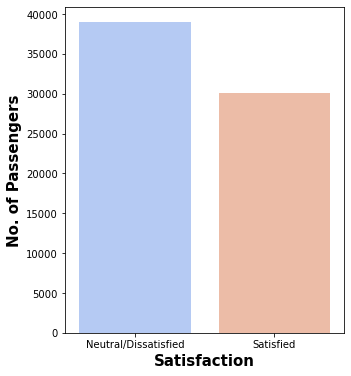

In [24]:
fig = plt.figure(figsize=[5,6])
ax=sns.countplot(data=df,x='Satisfaction',palette='coolwarm')
ax.set_xticklabels(['Neutral/Dissatisfied','Satisfied'])
plt.xlabel('Satisfaction',weight='bold',fontsize='15')   
plt.ylabel('No. of Passengers',weight='bold',fontsize='15')   
plt.show()

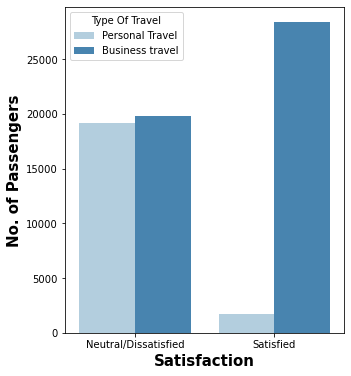

In [25]:
fig = plt.figure(figsize=[5,6])
ax = sns.countplot(data=df,x='Satisfaction',hue='Type Of Travel',palette='Blues')
ax.set_xticklabels(['Neutral/Dissatisfied','Satisfied'])
plt.xlabel('Satisfaction',weight='bold',fontsize='15')   
plt.ylabel('No. of Passengers',weight='bold',fontsize='15')   
plt.show()

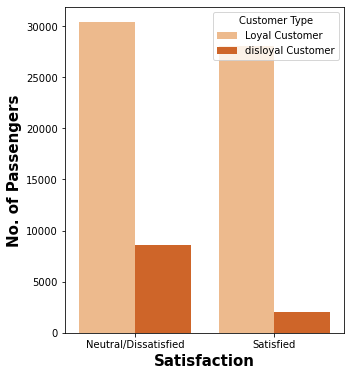

In [26]:
fig = plt.figure(figsize=[5,6])
ax = sns.countplot(data=df,x='Satisfaction',hue='Customer Type',palette='Oranges')
ax.set_xticklabels(['Neutral/Dissatisfied','Satisfied'])
plt.xlabel('Satisfaction',weight='bold',fontsize='15')   
plt.ylabel('No. of Passengers',weight='bold',fontsize='15')   
plt.show()

In [27]:
df1 = pd.get_dummies(df,columns=['Gender','Customer Type','Type Of Travel','Class'],drop_first=True)
df1

,Satisfaction,Age,Flight Distance,Inflight Wifi Service,Departure/Arrival Time Convenience,Ease Of Online Booking,Gate Location,Food And Drink,Online Boarding,Seat Comfort,...,Leg Room,Baggage Handling,Checkin Service,Inflight Service,Cleanliness,Total Delay,Gender_Male,Customer Type_disloyal Customer,Type Of Travel_Personal Travel,Class_Economy
0,0,13,460,3,4,3,1,5,3,5,...,3,4,4,5,5,43.0,1,0,1,1
1,0,25,235,3,2,3,3,1,3,1,...,5,3,1,4,1,7.0,1,1,0,0
2,0,25,562,2,5,5,5,2,2,2,...,5,3,1,4,2,20.0,0,0,0,0
3,1,61,214,3,3,3,3,4,5,5,...,4,4,3,3,3,0.0,1,0,0,0
4,0,26,1180,3,4,2,1,1,2,1,...,4,4,4,4,1,0.0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69061,0,36,432,1,5,1,3,4,1,4,...,2,5,2,3,4,0.0,0,1,0,1
69062,0,34,526,3,3,3,1,4,3,4,...,2,4,4,5,4,0.0,1,1,0,0
69063,0,17,828,2,5,1,5,2,1,2,...,3,4,5,4,2,0.0,0,0,1,1
69064,1,14,1127,3,3,3,3,4,4,4,...,2,5,4,5,4,0.0,1,0,0,0


In [28]:
df['Inflight Wifi Service'].value_counts()

3    20681
1    14925
2    13417
5    10977
4     9066
Name: Inflight Wifi Service, dtype: int64

In [29]:
group = df1.groupby(['Satisfaction','Class_Economy'])['Class_Economy'].count()
group

Satisfaction  Class_Economy
0             0                10710
              1                28261
1             0                23593
              1                 6502
Name: Class_Economy, dtype: int64

In [30]:
df1 = df1.drop('Gender_Male',axis=1)

In [31]:
corr_matrix = df1.corr()
corr_matrix

,Satisfaction,Age,Flight Distance,Inflight Wifi Service,Departure/Arrival Time Convenience,Ease Of Online Booking,Gate Location,Food And Drink,Online Boarding,Seat Comfort,...,On-board Service,Leg Room,Baggage Handling,Checkin Service,Inflight Service,Cleanliness,Total Delay,Customer Type_disloyal Customer,Type Of Travel_Personal Travel,Class_Economy
Satisfaction,1.000000,0.150330,0.303677,0.348541,-0.070339,0.204093,0.043578,0.229684,0.566547,0.372681,...,0.345886,0.344405,0.270842,0.237069,0.268040,0.331106,-0.055746,-0.210703,-0.469940,-0.504920
Age,0.150330,1.000000,0.083523,0.015717,-0.018813,0.017418,0.016286,0.022591,0.190272,0.159516,...,0.064508,0.053213,-0.040651,0.037817,-0.046491,0.055343,-0.016000,-0.248931,-0.065730,-0.137597
Flight Distance,0.303677,0.083523,1.000000,0.005510,-0.076475,0.050290,0.031325,0.057600,0.195383,0.154670,...,0.115268,0.134143,0.069399,0.074036,0.061872,0.095962,-0.000989,-0.199221,-0.280260,-0.468605
Inflight Wifi Service,0.348541,0.015717,0.005510,1.000000,0.441308,0.672462,0.443898,0.141383,0.420391,0.135243,...,0.119044,0.151017,0.111939,0.051640,0.102409,0.144782,-0.025515,-0.012180,-0.119000,-0.039514
Departure/Arrival Time Convenience,-0.070339,-0.018813,-0.076475,0.441308,1.000000,0.576451,0.596772,-0.010922,0.043472,-0.020132,...,0.061496,-0.005752,0.068147,0.099593,0.069379,-0.004830,-0.005037,-0.090479,0.257842,0.129964
Ease Of Online Booking,0.204093,0.017418,0.050290,0.672462,0.576451,1.000000,0.599579,0.024465,0.311904,0.024961,...,0.024647,0.079828,0.018964,0.010062,0.017221,0.012290,-0.010531,-0.028937,-0.122754,-0.104740
Gate Location,0.043578,0.016286,0.031325,0.443898,0.596772,0.599579,1.000000,0.003245,0.025883,0.016101,...,-0.008573,0.009167,-0.001322,-0.023836,-0.004327,0.000937,0.001105,-0.034772,-0.072084,-0.048318
Food And Drink,0.229684,0.022591,0.057600,0.141383,-0.010922,0.024465,0.003245,1.000000,0.263983,0.565449,...,0.065210,0.035821,0.038652,0.096476,0.038172,0.643129,-0.024135,-0.057759,-0.069419,-0.089825
Online Boarding,0.566547,0.190272,0.195383,0.420391,0.043472,0.311904,0.025883,0.263983,1.000000,0.454027,...,0.171895,0.141128,0.100118,0.225618,0.090729,0.366401,-0.033037,-0.184988,-0.220551,-0.321064
Seat Comfort,0.372681,0.159516,0.154670,0.135243,-0.020132,0.024961,0.016101,0.565449,0.454027,1.000000,...,0.144117,0.114395,0.082143,0.202177,0.079402,0.674680,-0.029623,-0.151569,-0.134707,-0.237519


Text(0.5, 1.0, 'Correlation Heatmap')

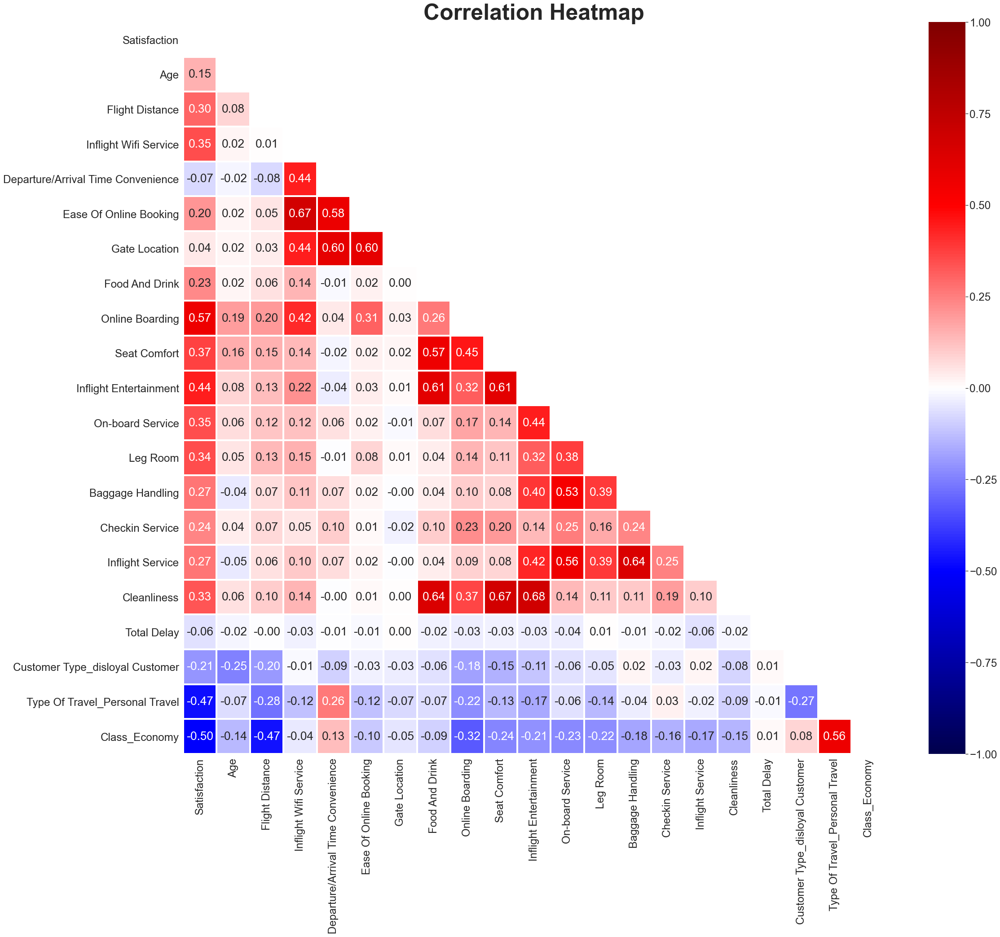

In [32]:
sns.set(style='white',font_scale=2.2)
fig = plt.figure(figsize=[35,30])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(150, 0, as_cmap=True)
sns.heatmap(corr_matrix,cmap='seismic',linewidth=3,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=50)

In [33]:
X = df1.drop('Satisfaction',axis=1)
y = df1['Satisfaction']

In [34]:
X=X.drop(['Age','Flight Distance'],axis=1)

In [35]:
X.head()

,Inflight Wifi Service,Departure/Arrival Time Convenience,Ease Of Online Booking,Gate Location,Food And Drink,Online Boarding,Seat Comfort,Inflight Entertainment,On-board Service,Leg Room,Baggage Handling,Checkin Service,Inflight Service,Cleanliness,Total Delay,Customer Type_disloyal Customer,Type Of Travel_Personal Travel,Class_Economy
0,3,4,3,1,5,3,5,5,4,3,4,4,5,5,43.0,0,1,1
1,3,2,3,3,1,3,1,1,1,5,3,1,4,1,7.0,1,0,0
2,2,5,5,5,2,2,2,2,2,5,3,1,4,2,20.0,0,0,0
3,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0.0,0,0,0
4,3,4,2,1,1,2,1,1,3,4,4,4,4,1,0.0,0,1,1


In [36]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [37]:
results = []
clf=RandomForestClassifier()
# Fitting model
clf.fit(X_train, y_train)  
# Predict target value     
y_pred = clf.predict(X_test)      
    
# Calculate the accuracy of the model
score = clf.score(X_test, y_test).round(3)*100 
    
# Calculate the precision score of the model
precision = precision_score(y_test, y_pred).round(3)*100
    
# Calculate the recall score of the model
recall = recall_score(y_test, y_pred).round(3)*100
    
# Calculate the F1 score of the model
f1 = f1_score(y_test, y_pred).round(3)*100
    
 # Calculaate the ROC_AUC score
try:
    y_pred_prob = clf.predict_proba(X_test) [:,1]
except:
    roc = 'N.A'        
else: 
        roc = roc_auc_score(y_test, y_pred_prob).round(3)*100

In [38]:
results.append([score, precision, recall, f1, roc])
    
results = pd.DataFrame(results, columns=['Accuracy','Precision', 'Recall', 'F1', 'ROC_AUC'])
print("The results of Random Forest model :","\n",results)

The results of Random Forest model : 
    Accuracy  Precision  Recall    F1  ROC_AUC
0      96.4       97.1    94.5  95.8     99.4


In [39]:
import pickle
file=open("Airlinepred.pkl","wb")
pickle.dump(clf,file)
file.close()

In [40]:
pred=pickle.load(open('Airlinepred.pkl','rb'))

In [41]:
print(X_test.iloc[12],"\n",y_test.iloc[12])

Inflight Wifi Service                 5.0
Departure/Arrival Time Convenience    5.0
Ease Of Online Booking                5.0
Gate Location                         5.0
Food And Drink                        4.0
Online Boarding                       4.0
Seat Comfort                          4.0
Inflight Entertainment                4.0
On-board Service                      1.0
Leg Room                              3.0
Baggage Handling                      3.0
Checkin Service                       3.0
Inflight Service                      3.0
Cleanliness                           4.0
Total Delay                           3.0
Customer Type_disloyal Customer       0.0
Type Of Travel_Personal Travel        0.0
Class_Economy                         0.0
Name: 14944, dtype: float64 
 1


In [42]:
#change the input data to a numpy array
datapoint=np.array(X_test.iloc[12])
#reshape the numpy array as we are predicting for only one instance
datapoint=datapoint.reshape(1,-1)

prediction=pred.predict(datapoint)
print(prediction)

[1]


In [43]:
import lime

In [44]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=[0,1],
    mode='classification'
)

In [45]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[12], 
    predict_fn=clf.predict_proba)

exp.show_in_notebook(show_table=True)

In [46]:
y_test.iloc[50]

0

In [47]:
#change the input data to a numpy array
datapoint=np.array(X_test.iloc[50])
#reshape the numpy array as we are predicting for only one instance
datapoint=datapoint.reshape(1,-1)

prediction=pred.predict(datapoint)
print(prediction)

[0]


In [48]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[50], 
    predict_fn=clf.predict_proba)

exp.show_in_notebook(show_table=True)

In [49]:
y_test.iloc[178]

1

In [50]:
#change the input data to a numpy array
datapoint=np.array(X_test.iloc[178])
#reshape the numpy array as we are predicting for only one instance
datapoint=datapoint.reshape(1,-1)

prediction=pred.predict(datapoint)
print(prediction)

[1]


In [51]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[178], 
    predict_fn=clf.predict_proba)

exp.show_in_notebook(show_table=True)

In [52]:
y_test.iloc[48]

0

In [53]:
X_test.iloc[8]

Inflight Wifi Service                   4.0
Departure/Arrival Time Convenience      3.0
Ease Of Online Booking                  4.0
Gate Location                           5.0
Food And Drink                          3.0
Online Boarding                         4.0
Seat Comfort                            3.0
Inflight Entertainment                  3.0
On-board Service                        4.0
Leg Room                                5.0
Baggage Handling                        3.0
Checkin Service                         3.0
Inflight Service                        2.0
Cleanliness                             3.0
Total Delay                           108.0
Customer Type_disloyal Customer         0.0
Type Of Travel_Personal Travel          1.0
Class_Economy                           1.0
Name: 23803, dtype: float64

In [54]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[48], 
    predict_fn=clf.predict_proba)

exp.show_in_notebook(show_table=True)

In [55]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[10], 
    predict_fn=clf.predict_proba)

exp.show_in_notebook(show_table=True)

In [56]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[8], 
    predict_fn=clf.predict_proba)

exp.show_in_notebook(show_table=True)